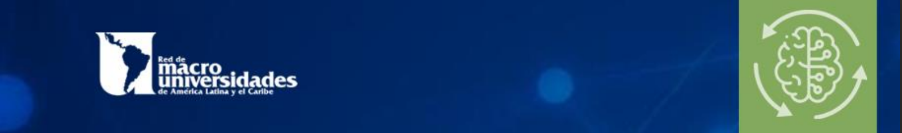


---
<center>

💻 **INTELIGENCIA ARTIFICIAL - LIDeSIA -FCEFyN - UNC**

</center>


---

Autor:.

Directora:    Dra. Inga. Laura Diaz Dávila.
###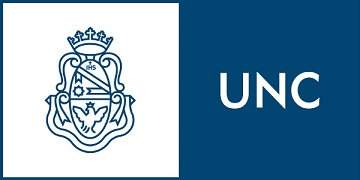

In [ ]:
# TensorFlow y tf.keras
import tensorflow as tf
from tensorflow import keras

# Librerias de ayuda
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
fashion_mnist = keras.datasets.fashion_mnist

(train_inputs, train_labels), (test_inputs, test_labels) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [ ]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

In [ ]:
train_inputs.shape

(60000, 28, 28)

In [ ]:
len(train_labels)

60000

In [ ]:
train_labels

array([9, 0, 0, ..., 3, 0, 5], dtype=uint8)

In [ ]:
test_inputs.shape

(10000, 28, 28)

In [ ]:
len(test_labels)

10000

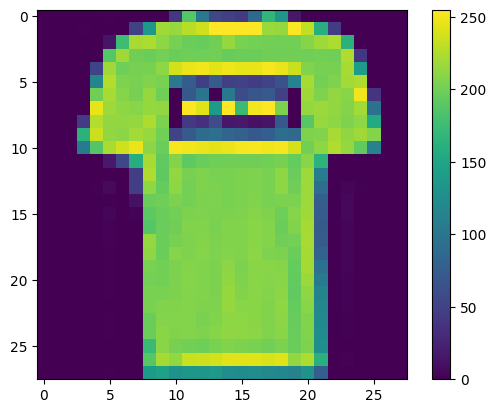

In [ ]:
plt.figure()
plt.imshow(train_inputs[1])
plt.colorbar()
plt.grid(False)
plt.show()

In [ ]:
train_inputs = train_inputs / 255.0

test_inputs = test_inputs / 255.0

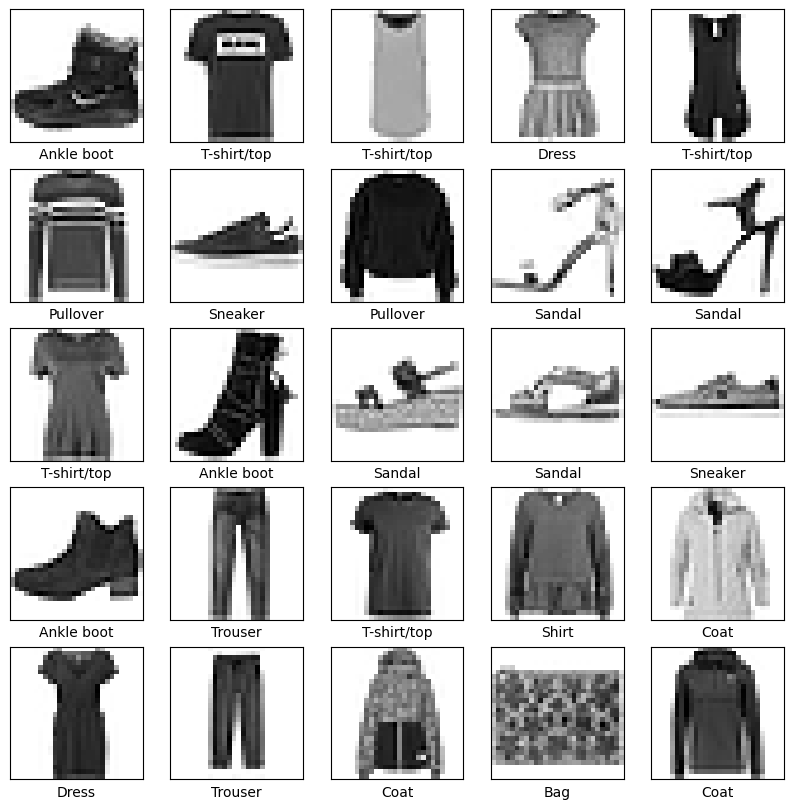

In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_inputs[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])

In [ ]:
'''
input_img=keras.Input(shape=(28,28,1))

x=layers.Flatten()(input_img)
x=layers.Dense(128, activation='relu')(x)
clasif=layers.Dense(10, activation='sigmoid')(x)
'''


"\ninput_img=keras.Input(shape=(28,28,1))\n\nx=layers.Flatten()(input_img)\nx=layers.Dense(128, activation='relu')(x)\nclasif=layers.Dense(10, activation='sigmoid')(x)\n"

In [ ]:
'''
model = tf.keras.Sequential()
model.add(tf.keras.Input(shape=(28,28,1)))
model.add(tf.keras.layers.Dense(128))
'''


'\nmodel = tf.keras.Sequential()\nmodel.add(tf.keras.Input(shape=(28,28,1)))\nmodel.add(tf.keras.layers.Dense(128))\n'

In [ ]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 128)               100480    
                                                                 
 dense_1 (Dense)             (None, 10)                1290      
                                                                 
Total params: 101,770
Trainable params: 101,770
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history=model.fit(train_inputs, train_labels, epochs=5)

Epoch 1/5
1875/1875 [==============================] - 7s 3ms/step - loss: 0.4997 - accuracy: 0.8255
Epoch 2/5
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3765 - accuracy: 0.8659
Epoch 3/5
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3401 - accuracy: 0.8759
Epoch 4/5
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3136 - accuracy: 0.8851
Epoch 5/5
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2961 - accuracy: 0.8911


In [ ]:
test_loss, test_acc = model.evaluate(test_inputs,  test_labels, verbose=2)

print('\nTest accuracy:', test_acc)

313/313 - 1s - loss: 0.3487 - accuracy: 0.8780 - 633ms/epoch - 2ms/step

Test accuracy: 0.878000020980835


In [ ]:
model.evaluate(test_inputs,  test_labels)

313/313 [==============================] - 1s 2ms/step - loss: 0.3487 - accuracy: 0.8780


[0.34870851039886475, 0.878000020980835]

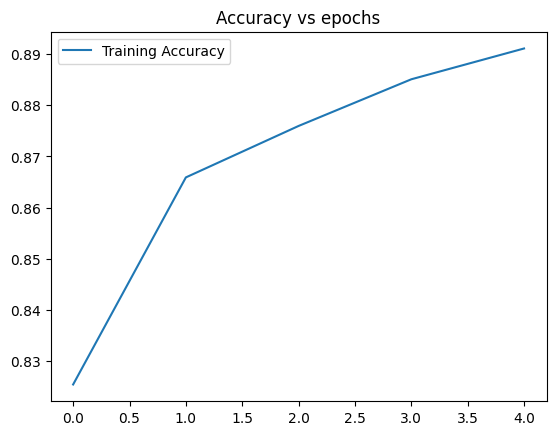

In [ ]:
plt.figure()
plt.title("Accuracy vs epochs")
plt.plot( history.history['accuracy'] )
plt.legend(['Training Accuracy']);

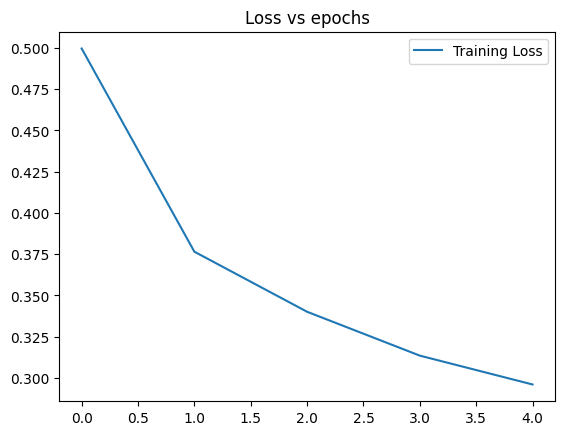

In [ ]:
plt.figure()
plt.title("Loss vs epochs")
plt.plot( history.history['loss'] )
plt.legend(['Training Loss'])

In [ ]:
predictions = model.predict(test_inputs)

313/313 [==============================] - 1s 2ms/step


In [ ]:
predictions[0]

array([2.3086823e-06, 3.1573748e-07, 3.2964343e-07, 6.2630778e-07,
       3.0096811e-07, 4.6863334e-04, 2.3064640e-06, 2.3391830e-02,
       3.7698862e-06, 9.7612959e-01], dtype=float32)

In [ ]:
np.argmax(predictions[0])

9

In [ ]:
test_labels[0]

9

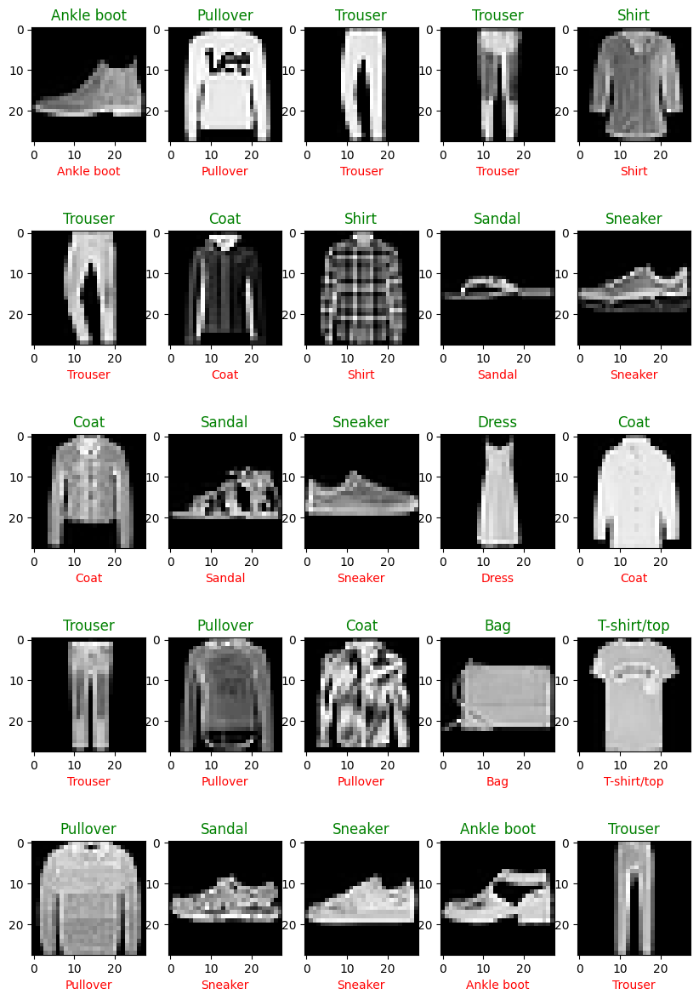

In [ ]:
plt.figure(figsize=(10,15))
for i in range(25):
    plt.subplot(5,5,i+1)
    #plt.xticks([])
    #plt.yticks([])
    #plt.grid(False)

    plt.imshow(test_inputs[i].reshape(28,28), 'gray')
    plt.title(class_names[test_labels[i]], color='g')
    plt.xlabel(class_names[np.argmax(predictions[i])], color='r')

plt.show()

In [ ]:
history=model.fit(train_inputs, train_labels,
                  epochs=5,
                  batch_size=100,
                  shuffle=True,
                  validation_data=(test_inputs, test_labels))

Epoch 1/5
600/600 [==============================] - 3s 5ms/step - loss: 0.2549 - accuracy: 0.9057 - val_loss: 0.3287 - val_accuracy: 0.8800
Epoch 2/5
600/600 [==============================] - 3s 5ms/step - loss: 0.2493 - accuracy: 0.9072 - val_loss: 0.3232 - val_accuracy: 0.8846
Epoch 3/5
600/600 [==============================] - 3s 5ms/step - loss: 0.2450 - accuracy: 0.9097 - val_loss: 0.3390 - val_accuracy: 0.8774
Epoch 4/5
600/600 [==============================] - 4s 7ms/step - loss: 0.2380 - accuracy: 0.9111 - val_loss: 0.3184 - val_accuracy: 0.8864
Epoch 5/5
600/600 [==============================] - 6s 9ms/step - loss: 0.2331 - accuracy: 0.9137 - val_loss: 0.3237 - val_accuracy: 0.8874


In [ ]:
test_loss, test_acc = model.evaluate(test_inputs,  test_labels, verbose=2)

print('\nTest accuracy:', test_acc)

313/313 - 1s - loss: 0.3237 - accuracy: 0.8874 - 1s/epoch - 4ms/step

Test accuracy: 0.8873999714851379


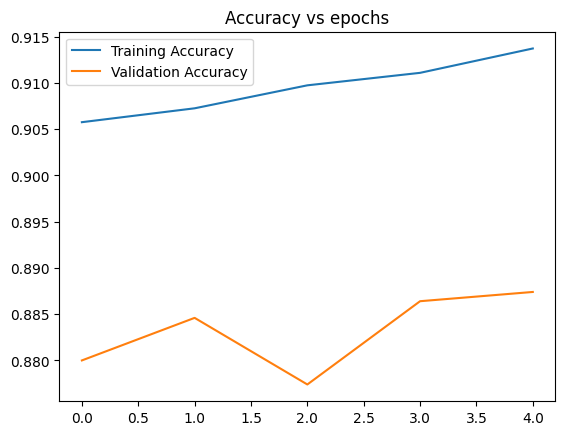

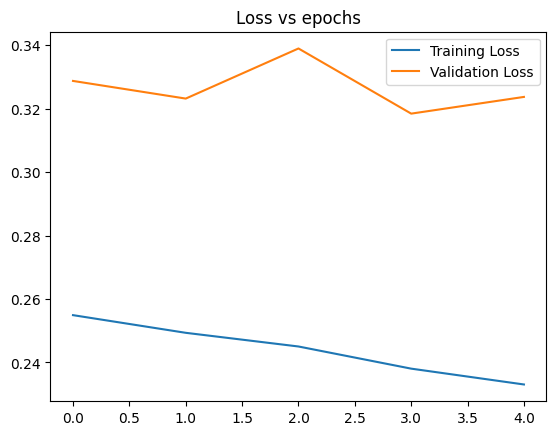

In [ ]:
plt.figure()
plt.title("Accuracy vs epochs")
plt.plot( history.history['accuracy'] )
plt.plot( history.history['val_accuracy'] )
plt.legend(['Training Accuracy', 'Validation Accuracy'])


plt.figure()
plt.title("Loss vs epochs")
plt.plot( history.history['loss'] )
plt.plot( history.history['val_loss'] )
plt.legend(['Training Loss', 'Validation Loss'])

In [ ]:
from sklearn.metrics import confusion_matrix

cm=confusion_matrix(test_labels, np.argmax(predictions,axis=1))
cm

array([[816,   1,  14,  51,   7,   0, 106,   0,   5,   0],
       [  0, 966,   1,  25,   5,   0,   2,   0,   1,   0],
       [ 11,   0, 827,   9,  77,   0,  76,   0,   0,   0],
       [ 17,   4,  10, 901,  36,   0,  30,   0,   2,   0],
       [  0,   0, 129,  27, 757,   0,  87,   0,   0,   0],
       [  0,   0,   0,   1,   0, 942,   0,  32,   2,  23],
       [104,   2,  96,  47,  52,   0, 695,   0,   4,   0],
       [  0,   0,   0,   0,   0,   8,   0, 938,   0,  54],
       [  5,   0,   8,   6,   7,   2,   5,   4, 963,   0],
       [  0,   0,   0,   0,   0,   2,   1,  22,   0, 975]])

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

cm_df=pd.DataFrame(cm)
cm_df

,0,1,2,3,4,5,6,7,8,9
0,816,1,14,51,7,0,106,0,5,0
1,0,966,1,25,5,0,2,0,1,0
2,11,0,827,9,77,0,76,0,0,0
3,17,4,10,901,36,0,30,0,2,0
4,0,0,129,27,757,0,87,0,0,0
5,0,0,0,1,0,942,0,32,2,23
6,104,2,96,47,52,0,695,0,4,0
7,0,0,0,0,0,8,0,938,0,54
8,5,0,8,6,7,2,5,4,963,0
9,0,0,0,0,0,2,1,22,0,975


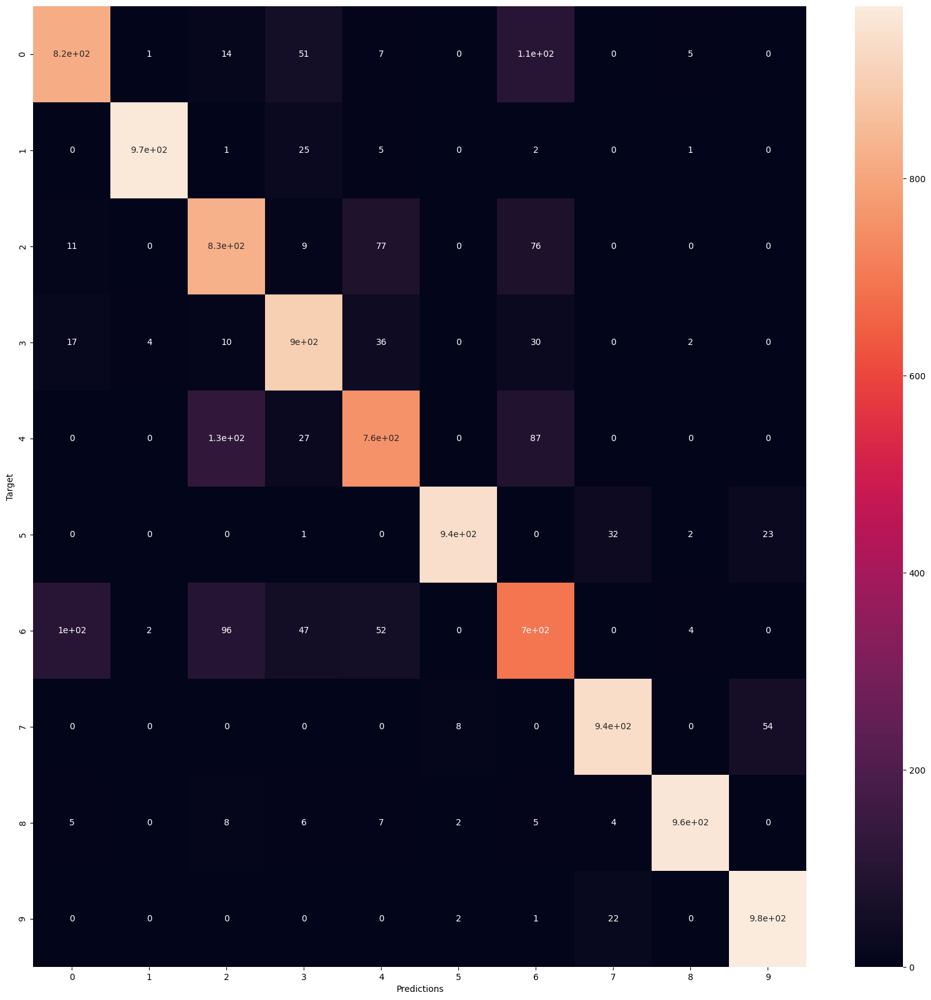

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(cm_df, annot=True)#, cmap= "YlGnBu", annot_kws={"size": 20}, cbar=False,  fmt='g');
plt.xlabel('Predictions');
plt.ylabel('Target');

ARMAR EN SKLEARN

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
clf=MLPClassifier(solver='adam',hidden_layer_sizes=128, max_iter=5)

In [ ]:
flatten_train_inputs=[]

for i in train_inputs:

  flatten_train_inputs.append(i.flatten())

In [ ]:
flatten_train_inputs

[array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.  

In [ ]:
clf.fit(flatten_train_inputs, train_labels)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (5) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(hidden_layer_sizes=128, max_iter=5)

In [ ]:
flatten_test_inputs=[]

for i in test_inputs:

  flatten_test_inputs.append(i.flatten())

In [ ]:
predictions=clf.predict(flatten_test_inputs)

In [ ]:
predictions

array([9, 2, 1, ..., 8, 1, 5], dtype=uint8)

In [ ]:
cm=confusion_matrix(test_labels, predictions)
cm

array([[865,   0,  16,  25,   2,   0,  83,   1,   8,   0],
       [  5, 956,   1,  28,   4,   0,   4,   0,   2,   0],
       [ 17,   2, 750,  12, 149,   0,  68,   0,   2,   0],
       [ 28,   6,  13, 880,  45,   0,  22,   0,   6,   0],
       [  0,   0,  71,  24, 833,   1,  66,   0,   5,   0],
       [  0,   0,   0,   1,   0, 957,   0,  33,   2,   7],
       [158,   1,  89,  33,  89,   0, 619,   0,  11,   0],
       [  0,   0,   0,   0,   0,  26,   0, 957,   0,  17],
       [  5,   1,   3,   3,   7,   2,   4,   5, 970,   0],
       [  1,   0,   0,   0,   0,  13,   1,  53,   0, 932]])

In [ ]:
cm_df=pd.DataFrame(cm)
cm_df

,0,1,2,3,4,5,6,7,8,9
0,865,0,16,25,2,0,83,1,8,0
1,5,956,1,28,4,0,4,0,2,0
2,17,2,750,12,149,0,68,0,2,0
3,28,6,13,880,45,0,22,0,6,0
4,0,0,71,24,833,1,66,0,5,0
5,0,0,0,1,0,957,0,33,2,7
6,158,1,89,33,89,0,619,0,11,0
7,0,0,0,0,0,26,0,957,0,17
8,5,1,3,3,7,2,4,5,970,0
9,1,0,0,0,0,13,1,53,0,932


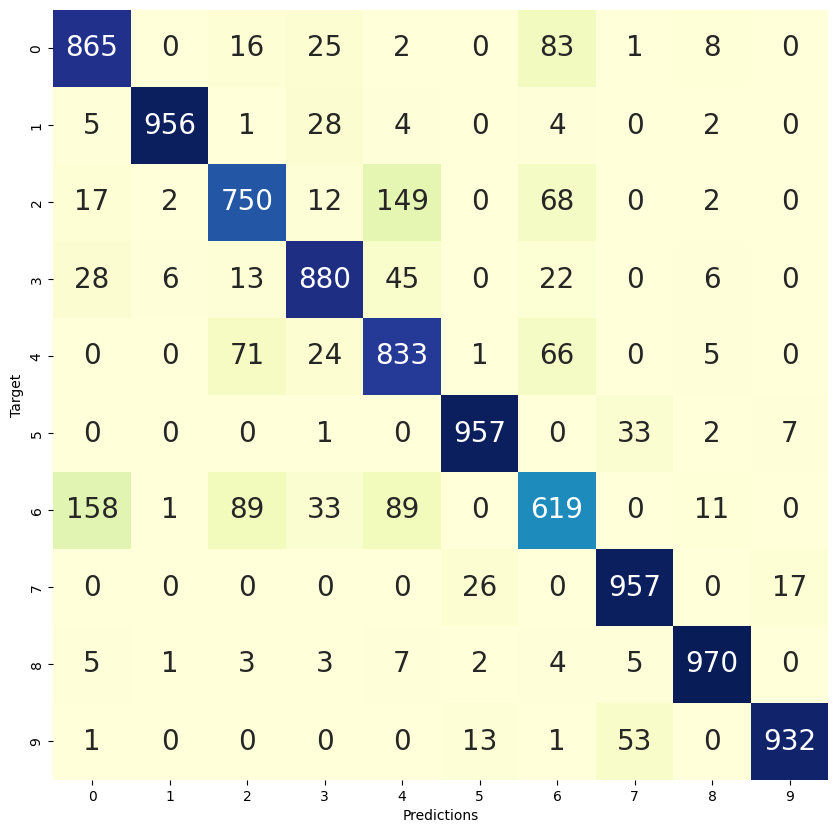

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(cm_df, annot=True, cmap= "YlGnBu", annot_kws={"size": 20}, cbar=False,  fmt='g');
plt.xlabel('Predictions');
plt.ylabel('Target');